<a href="https://colab.research.google.com/github/tatendamawango/Data-Science-and-Artificial-Intelligence/blob/main/exAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

data = pd.read_csv('activity.csv')

print("Dataset Shape:", data.shape)
print(data.head())

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

print("Missing values per column:\n", data.isnull().sum())

X.fillna(X.mean(), inplace=True)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

print("Training set shape (X):", X_train.shape)
print("Test set shape (X):", X_test.shape)
print("Training set shape (y):", y_train.shape)
print("Test set shape (y):", y_test.shape)

Dataset Shape: (4480, 535)
   person_id        V2        V3        V4       V5        V6       V7  \
0          1 -0.004125  0.254095  0.001426 -0.01037 -0.538509  5.95534   
1          1  0.031029  0.193761  0.012918 -0.00237  0.781415  5.18794   
2          1  0.015678  0.182336 -0.003028 -0.02337  0.881194  5.66530   
3          1  0.014525  0.176636 -0.006161 -0.02737  1.024900  6.10968   
4          1  0.010349  0.179248 -0.008526 -0.02737  0.935697  5.83902   

        V8       V9      V10  ...     V526         V527      V528     V529  \
0  1.04063 -1.37437 -0.10937  ...  1015.36  717032000.0  0.027384  2.53425   
1  0.98963 -0.71937 -0.08737  ...  1015.78  705854000.0  0.016947  2.51513   
2  0.87563 -0.71937 -0.08037  ...  1016.16  627018000.0  0.008129  2.25959   
3  0.91063 -0.71937 -0.08037  ...  1015.61  559748000.0  0.007377  2.13924   
4  0.91063 -0.75637 -0.08337  ...  1015.67  484473000.0  0.011448  1.93595   

      V530     V531     V532       V533       V534  activit

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
dt_pred = dt_model.predict(X_test)

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)

print("Decision Tree Accuracy:", accuracy_score(y_test, dt_pred))
print("Decision Tree Classification Report:\n", classification_report(y_test, dt_pred))

print("Random Forest Accuracy:", accuracy_score(y_test, rf_pred))
print("Random Forest Classification Report:\n", classification_report(y_test, rf_pred))

Decision Tree Accuracy: 0.9296875
Decision Tree Classification Report:
               precision    recall  f1-score   support

   emotional       0.88      0.92      0.90       226
      mental       0.88      0.86      0.87       216
      neural       0.98      0.96      0.97       224
    physical       0.98      0.98      0.98       230

    accuracy                           0.93       896
   macro avg       0.93      0.93      0.93       896
weighted avg       0.93      0.93      0.93       896

Random Forest Accuracy: 0.9877232142857143
Random Forest Classification Report:
               precision    recall  f1-score   support

   emotional       0.97      1.00      0.98       226
      mental       0.99      0.97      0.98       216
      neural       1.00      0.98      0.99       224
    physical       1.00      1.00      1.00       230

    accuracy                           0.99       896
   macro avg       0.99      0.99      0.99       896
weighted avg       0.99      0.9

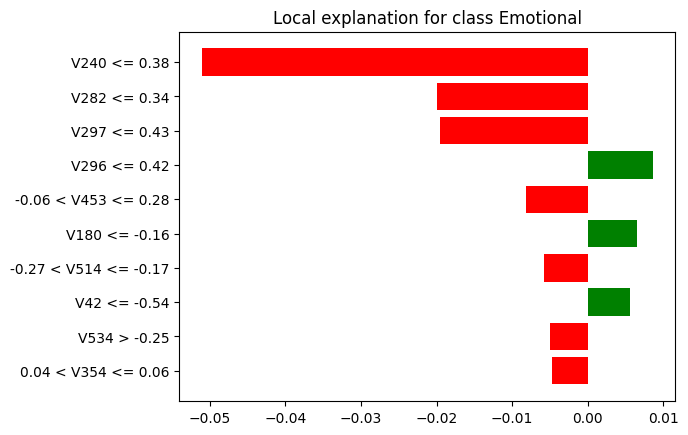

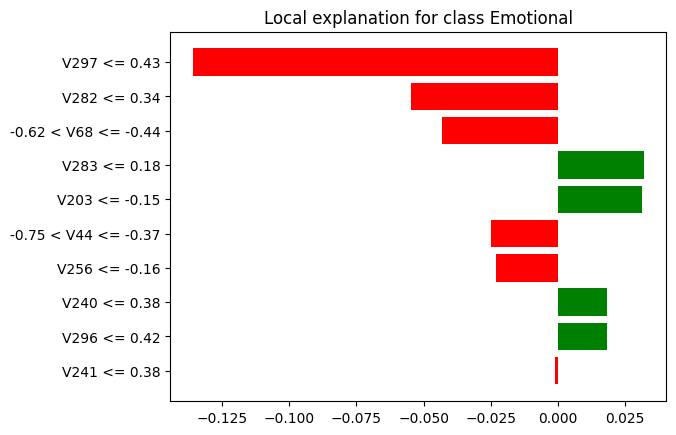

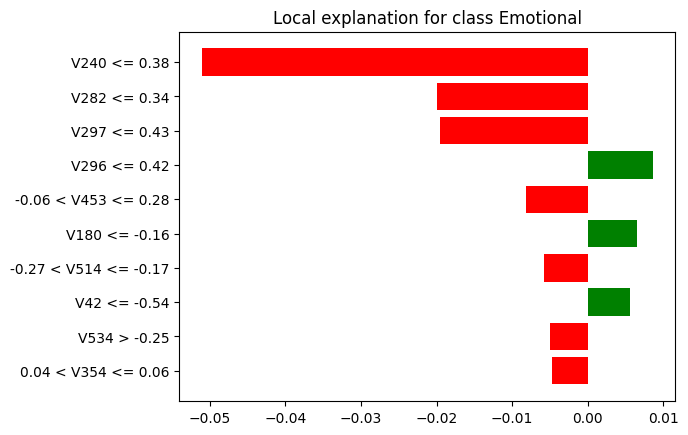

In [ ]:
!pip install lime
import lime
import lime.lime_tabular

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    X_train,
    feature_names=[f"V{i+1}" for i in range(X_train.shape[1])],
    class_names=['Neutral', 'Emotional', 'Mental', 'Physical'],
    mode='classification'
)

i = 0

lime_exp_dt = explainer_lime.explain_instance(X_test[i], dt_model.predict_proba)
lime_exp_dt.show_in_notebook()

lime_exp_rf = explainer_lime.explain_instance(X_test[i], rf_model.predict_proba)
lime_exp_rf.show_in_notebook()

lime_exp_dt.as_pyplot_figure()
lime_exp_rf.as_pyplot_figure()

In [ ]:
import matplotlib.pyplot as plt

importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
plt.title("Feature Importances (Random Forest)")
plt.bar(range(10), importances[indices[:10]], align="center")
plt.xticks(range(10), [f"V{indices[i]+1}" for i in range(10)], rotation=45)
plt.xlim([-1, 10])
plt.show()

In [ ]:
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(rf_model, X_test, y_test, n_repeats=10, random_state=42)

sorted_idx = perm_importance.importances_mean.argsort()[::-1]

plt.figure(figsize=(10, 6))
plt.title("Permutation Feature Importance")
plt.bar(range(10), perm_importance.importances_mean[sorted_idx[:10]], align="center")
plt.xticks(range(10), [f"V{sorted_idx[i]+1}" for i in range(10)], rotation=45)
plt.xlim([-1, 10])
plt.show()


In [ ]:
print(rf_model.classes_)

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

features = [indices[0], indices[1], indices[2]]
target_class = 'emotional'

fig, ax = plt.subplots(figsize=(12, 6))
PartialDependenceDisplay.from_estimator(rf_model, X_test, features, target=target_class, ax=ax)
plt.suptitle(f"Partial Dependence Plots for Class: {target_class.capitalize()}", fontsize=16)
plt.show()


In [ ]:
from sklearn.inspection import PartialDependenceDisplay

features = [indices[0], indices[1], indices[2]]
target_class = 'mental'

fig, ax = plt.subplots(figsize=(12, 6))
PartialDependenceDisplay.from_estimator(rf_model, X_test, features, target=target_class, ax=ax)
plt.suptitle(f"Partial Dependence Plots for Class: {target_class.capitalize()}", fontsize=16)
plt.show()

NameError: name 'indices' is not defined

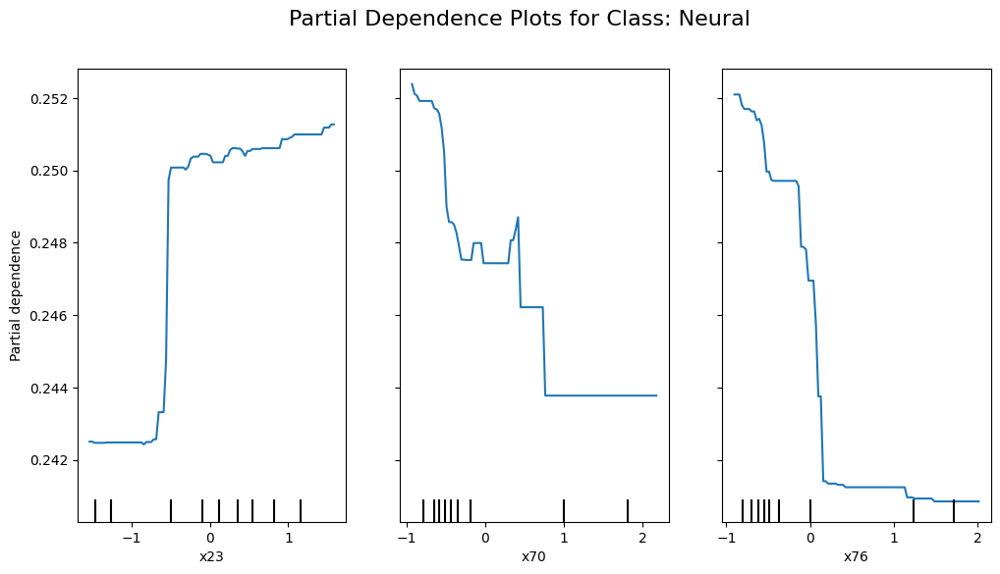

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

features = [indices[0], indices[1], indices[2]]
target_class = 'neural'

fig, ax = plt.subplots(figsize=(12, 6))
PartialDependenceDisplay.from_estimator(rf_model, X_test, features, target=target_class, ax=ax)
plt.suptitle(f"Partial Dependence Plots for Class: {target_class.capitalize()}", fontsize=16)
plt.show()

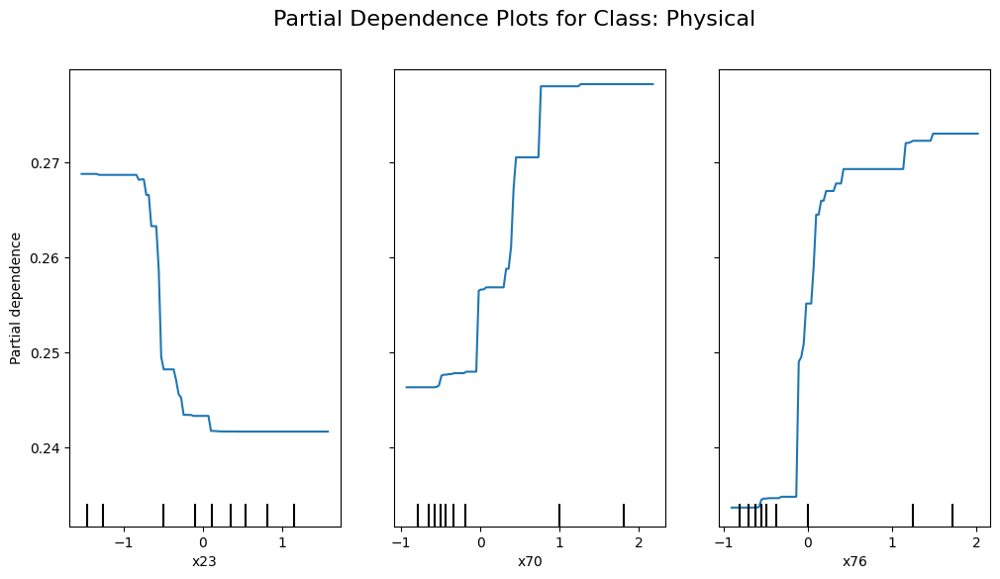

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

features = [indices[0], indices[1], indices[2]]
target_class = 'physical'

fig, ax = plt.subplots(figsize=(12, 6))
PartialDependenceDisplay.from_estimator(rf_model, X_test, features, target=target_class, ax=ax)
plt.suptitle(f"Partial Dependence Plots for Class: {target_class.capitalize()}", fontsize=16)
plt.show()

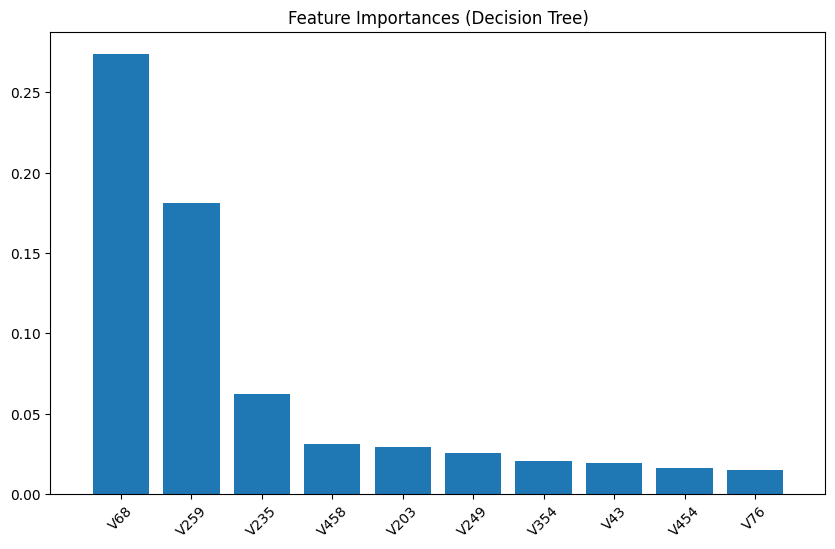

Decision Tree Accuracy: 0.9296875
Decision Tree Classification Report:
               precision    recall  f1-score   support

   emotional       0.88      0.92      0.90       226
      mental       0.88      0.86      0.87       216
      neural       0.98      0.96      0.97       224
    physical       0.98      0.98      0.98       230

    accuracy                           0.93       896
   macro avg       0.93      0.93      0.93       896
weighted avg       0.93      0.93      0.93       896



In [ ]:
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import numpy as np
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

importances_dt = dt_model.feature_importances_
indices_dt = np.argsort(importances_dt)[::-1]

plt.figure(figsize=(10, 6))
plt.title("Feature Importances (Decision Tree)")
plt.bar(range(10), importances_dt[indices_dt[:10]], align="center")
plt.xticks(range(10), [f"V{indices_dt[i]+1}" for i in range(10)], rotation=45)
plt.xlim([-1, 10])
plt.show()

dt_pred = dt_model.predict(X_test)
print("Decision Tree Accuracy:", accuracy_score(y_test, dt_pred))
print("Decision Tree Classification Report:\n", classification_report(y_test, dt_pred))

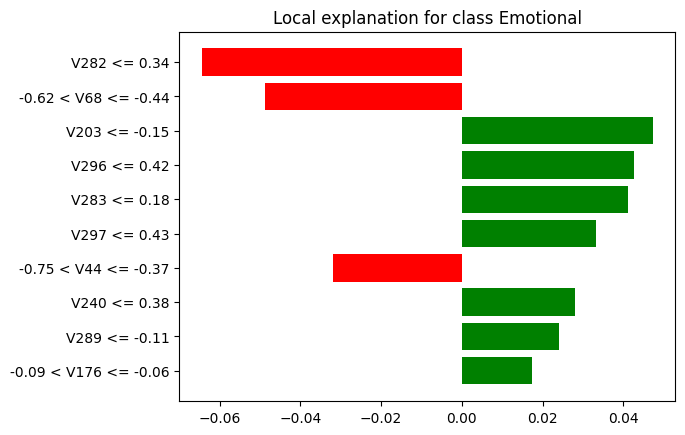

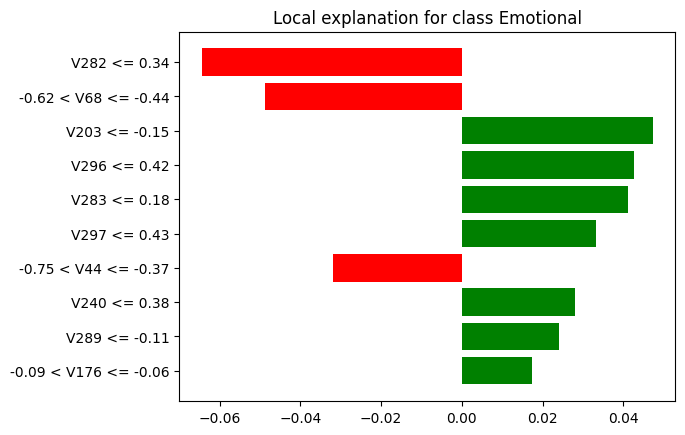

In [ ]:
explainer_lime_dt = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=[f"V{i+1}" for i in range(X_train.shape[1])], class_names=['Neutral', 'Emotional', 'Mental', 'Physical'], mode='classification')

i = 0
lime_exp_dt = explainer_lime_dt.explain_instance(X_test[i], dt_model.predict_proba)
lime_exp_dt.show_in_notebook()
lime_exp_dt.as_pyplot_figure()


In [ ]:
top_rf_features = [f"V{indices[i]+1}" for i in range(10)]
top_dt_features = [f"V{indices_dt[i]+1}" for i in range(10)]

feature_importance_df = pd.DataFrame({
    'Random Forest Importance': importances[indices[:10]],
    'Top Features (Random Forest)': top_rf_features,
    'Decision Tree Importance': importances_dt[indices_dt[:10]],
    'Top Features (Decision Tree)': top_dt_features
})

print("Feature Importance Comparison:")
feature_importance_df


Feature Importance Comparison:


,Random Forest Importance,Top Features (Random Forest),Decision Tree Importance,Top Features (Decision Tree)
0,0.021635,V24,0.273941,V68
1,0.021471,V71,0.181038,V259
2,0.020019,V77,0.062504,V235
3,0.016019,V68,0.031241,V458
4,0.015659,V53,0.029214,V203
5,0.014481,V44,0.025526,V249
6,0.013948,V70,0.020607,V354
7,0.013459,V46,0.019154,V43
8,0.012141,V203,0.016458,V454
9,0.011764,V76,0.014755,V76


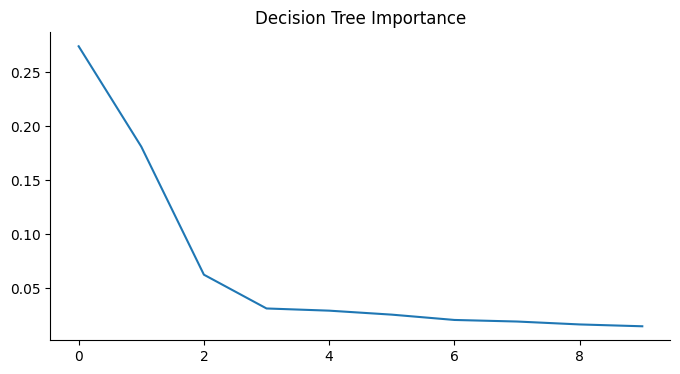

In [ ]:
# @title Decision Tree Importance

from matplotlib import pyplot as plt
feature_importance_df['Decision Tree Importance'].plot(kind='line', figsize=(8, 4), title='Decision Tree Importance')
plt.gca().spines[['top', 'right']].set_visible(False)

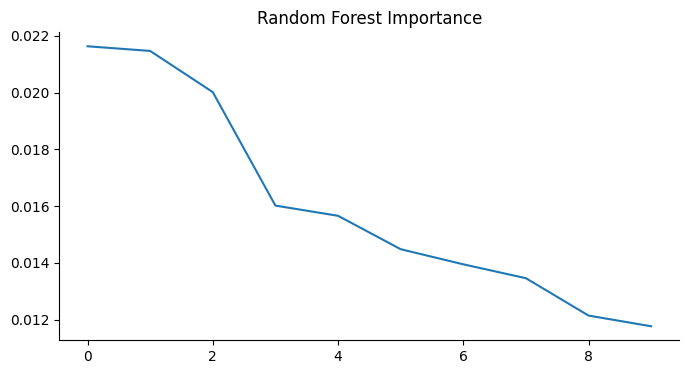

In [ ]:
# @title Random Forest Importance

from matplotlib import pyplot as plt
feature_importance_df['Random Forest Importance'].plot(kind='line', figsize=(8, 4), title='Random Forest Importance')
plt.gca().spines[['top', 'right']].set_visible(False)

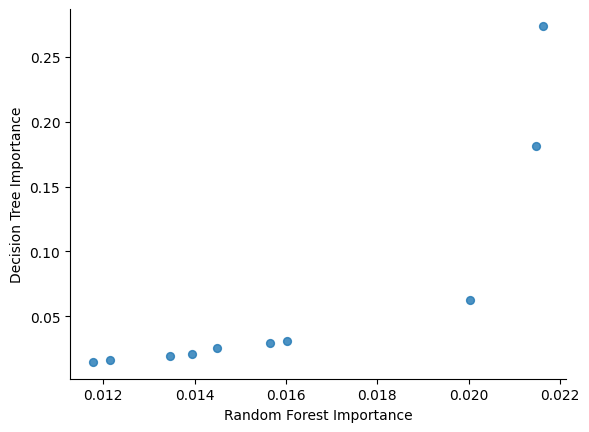

In [ ]:
# @title Random Forest Importance vs Decision Tree Importance

from matplotlib import pyplot as plt
feature_importance_df.plot(kind='scatter', x='Random Forest Importance', y='Decision Tree Importance', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

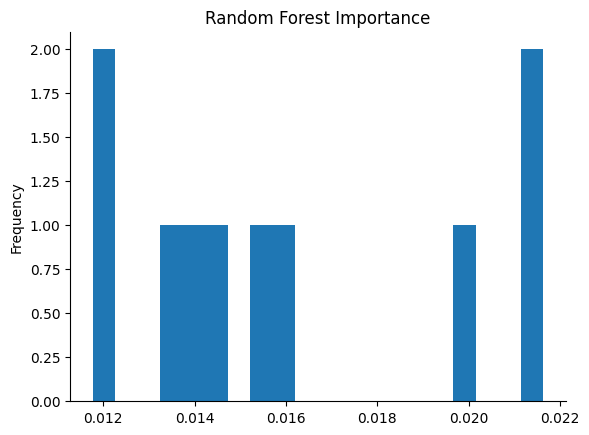

In [ ]:
# @title Random Forest Importance

from matplotlib import pyplot as plt
feature_importance_df['Random Forest Importance'].plot(kind='hist', bins=20, title='Random Forest Importance')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
lime_comparison_df = pd.DataFrame({
    'Feature (Random Forest)': [exp[0] for exp in lime_exp_rf.as_list()[:5]],
    'Importance (Random Forest)': [exp[1] for exp in lime_exp_rf.as_list()[:5]],
    'Feature (Decision Tree)': [exp[0] for exp in lime_exp_dt.as_list()[:5]],
    'Importance (Decision Tree)': [exp[1] for exp in lime_exp_dt.as_list()[:5]]
})

print("LIME Explanation Comparison:")
lime_comparison_df

LIME Explanation Comparison:


,Feature (Random Forest),Importance (Random Forest),Feature (Decision Tree),Importance (Decision Tree)
0,V282 <= 0.34,0.009907,V297 <= 0.43,-0.139187
1,-0.06 < V453 <= 0.28,-0.007922,V296 <= 0.42,-0.107715
2,0.04 < V354 <= 0.06,-0.006149,V283 <= 0.18,-0.059909
3,V297 <= 0.43,-0.005522,-0.62 < V68 <= -0.44,-0.039239
4,V241 <= 0.38,-0.005159,V310 <= 0.18,0.033337


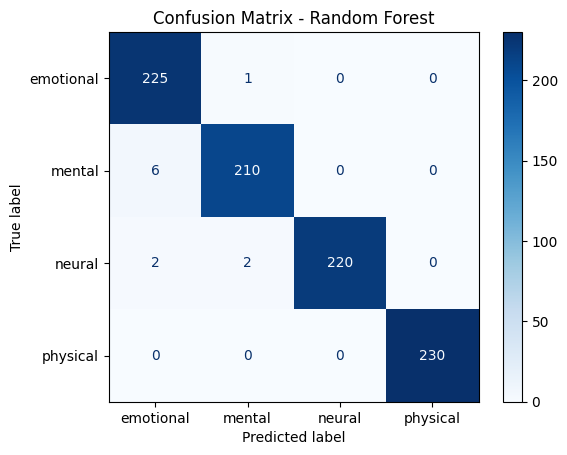

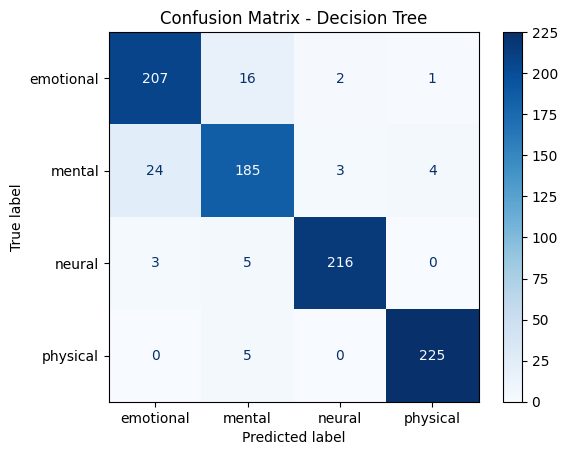

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

rf_pred = rf_model.predict(X_test)
dt_pred = dt_model.predict(X_test)

cm_rf = confusion_matrix(y_test, rf_pred, labels=rf_model.classes_)
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=rf_model.classes_)
disp_rf.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - Random Forest")
plt.show()

cm_dt = confusion_matrix(y_test, dt_pred, labels=dt_model.classes_)
disp_dt = ConfusionMatrixDisplay(confusion_matrix=cm_dt, display_labels=dt_model.classes_)
disp_dt.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - Decision Tree")
plt.show()


In [ ]:
results_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted (Random Forest)': rf_pred,
    'Predicted (Decision Tree)': dt_pred
})

misclassified_rf = results_df[results_df['Actual'] != results_df['Predicted (Random Forest)']]
misclassified_dt = results_df[results_df['Actual'] != results_df['Predicted (Decision Tree)']]

print("Misclassified Instances - Random Forest:")
print(misclassified_rf.head())

print("\nMisclassified Instances - Decision Tree:")
print(misclassified_dt.head())


Misclassified Instances - Random Forest:
         Actual Predicted (Random Forest) Predicted (Decision Tree)
731      mental                 emotional                    mental
810      neural                 emotional                    mental
2848  emotional                    mental                 emotional
1743     mental                 emotional                 emotional
69       mental                 emotional                    mental

Misclassified Instances - Decision Tree:
         Actual Predicted (Random Forest) Predicted (Decision Tree)
810      neural                 emotional                    mental
2083     mental                    mental                 emotional
1073     mental                    mental                 emotional
2979     mental                    mental                  physical
3738  emotional                 emotional                    mental


In [ ]:
rf_feature_importance = pd.DataFrame({
    'Feature': [f"V{i+1}" for i in range(X_train.shape[1])],
    'Importance': rf_model.feature_importances_
})

rf_feature_importance_sorted = rf_feature_importance.sort_values(by='Importance', ascending=False)
print("Top 10 Features - Random Forest:")
print(rf_feature_importance_sorted.head(10))

dt_feature_importance = pd.DataFrame({
    'Feature': [f"V{i+1}" for i in range(X_train.shape[1])],
    'Importance': dt_model.feature_importances_
})

dt_feature_importance_sorted = dt_feature_importance.sort_values(by='Importance', ascending=False)
print("Top 10 Features - Decision Tree:")
print(dt_feature_importance_sorted.head(10))


Top 10 Features - Random Forest:
    Feature  Importance
23      V24    0.021635
70      V71    0.021471
76      V77    0.020019
67      V68    0.016019
52      V53    0.015659
43      V44    0.014481
69      V70    0.013948
45      V46    0.013459
202    V203    0.012141
75      V76    0.011764
Top 10 Features - Decision Tree:
    Feature  Importance
67      V68    0.273941
258    V259    0.181038
234    V235    0.062504
457    V458    0.031241
202    V203    0.029214
248    V249    0.025526
353    V354    0.020607
42      V43    0.019154
453    V454    0.016458
75      V76    0.014755


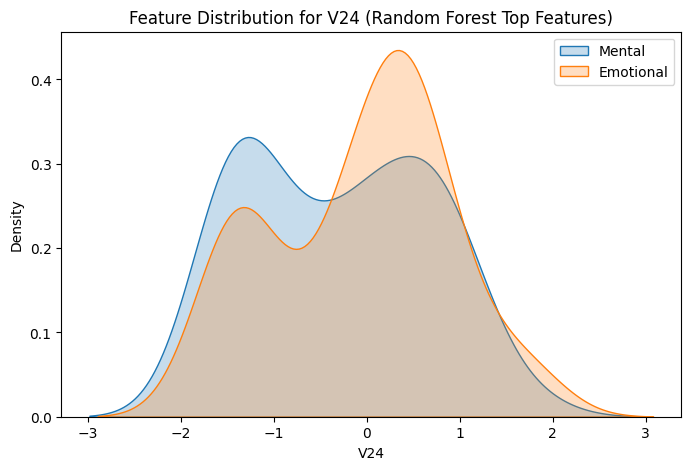

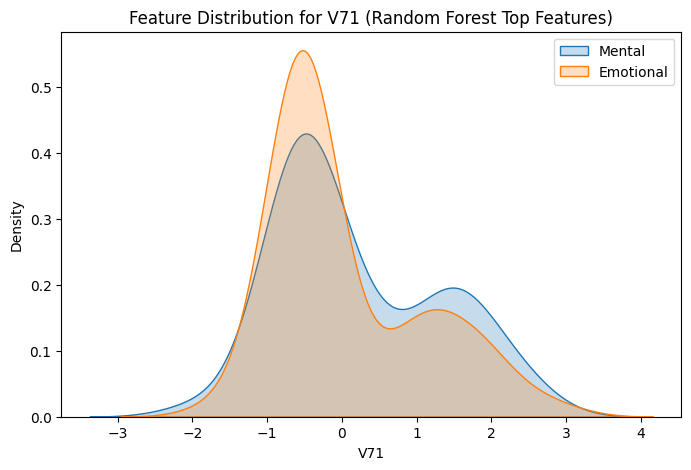

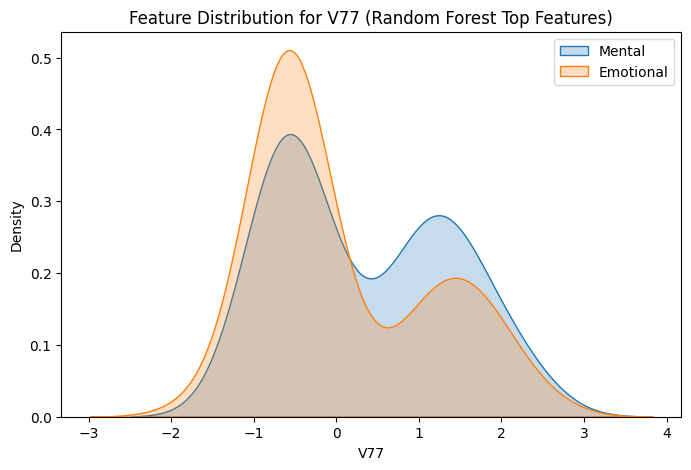

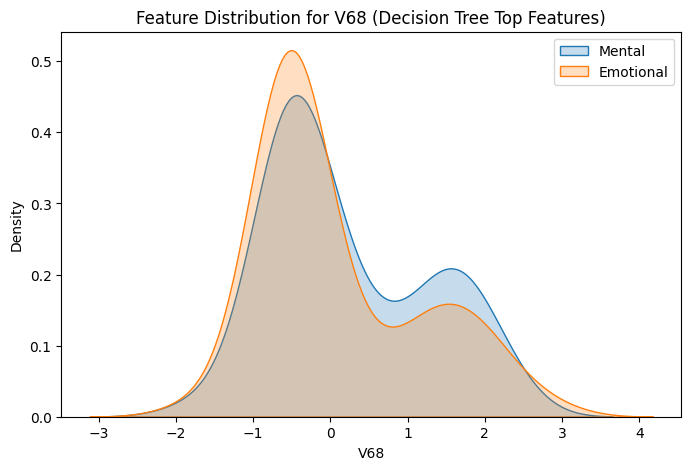

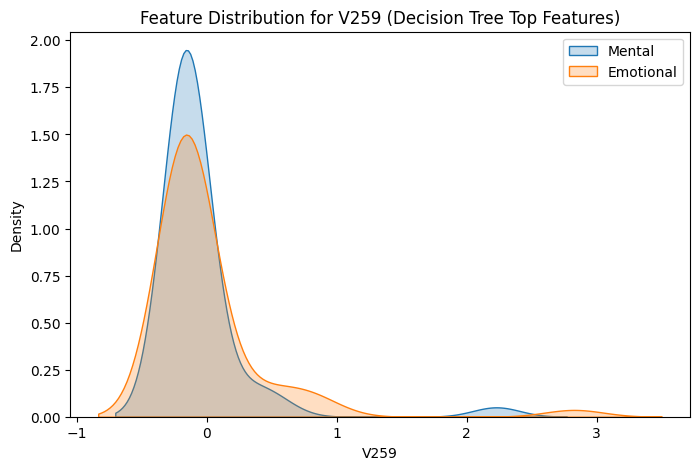

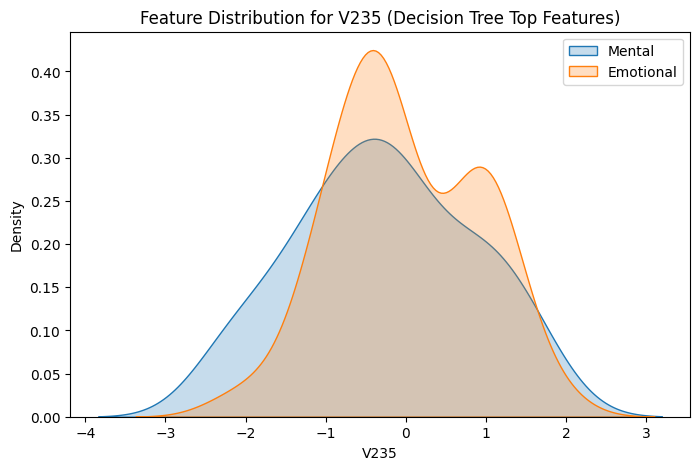

In [ ]:
import seaborn as sns

X_test_df = pd.DataFrame(X_test, columns=[f"V{i+1}" for i in range(X_test.shape[1])])
X_test_df['Activity'] = y_test

top_features_rf = rf_feature_importance_sorted['Feature'].head(3).tolist()
top_features_dt = dt_feature_importance_sorted['Feature'].head(3).tolist()

for feature in top_features_rf:
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=X_test_df[X_test_df['Activity'] == 'mental'], x=feature, label='Mental', fill=True)
    sns.kdeplot(data=X_test_df[X_test_df['Activity'] == 'emotional'], x=feature, label='Emotional', fill=True)
    plt.title(f"Feature Distribution for {feature} (Random Forest Top Features)")
    plt.legend()
    plt.show()

for feature in top_features_dt:
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=X_test_df[X_test_df['Activity'] == 'mental'], x=feature, label='Mental', fill=True)
    sns.kdeplot(data=X_test_df[X_test_df['Activity'] == 'emotional'], x=feature, label='Emotional', fill=True)
    plt.title(f"Feature Distribution for {feature} (Decision Tree Top Features)")
    plt.legend()
    plt.show()


In [ ]:
def add_noise(X, noise_level=0.1, noise_amount=0.05):
    X_noisy = X.copy()
    n_samples, n_features = X.shape
    n_noisy_features = int(noise_level * n_features)

    noisy_features = np.random.choice(n_features, n_noisy_features, replace=False)

    for feature in noisy_features:
        noise = np.random.normal(0, noise_amount, size=n_samples)
        X_noisy[:, feature] += noise

    return X_noisy

X_train_noisy = add_noise(X_train, noise_level=0.1, noise_amount=0.05)
X_test_noisy = add_noise(X_test, noise_level=0.1, noise_amount=0.05)



In [ ]:
rf_model_noisy = RandomForestClassifier(random_state=42)
rf_model_noisy.fit(X_train_noisy, y_train)

rf_pred_noisy = rf_model_noisy.predict(X_test_noisy)

from sklearn.metrics import accuracy_score, classification_report
print("Random Forest Accuracy (with Noise):", accuracy_score(y_test, rf_pred_noisy))
print("Random Forest Classification Report (with Noise):\n", classification_report(y_test, rf_pred_noisy))


Random Forest Accuracy (with Noise): 0.9866071428571429
Random Forest Classification Report (with Noise):
               precision    recall  f1-score   support

   emotional       0.97      0.99      0.98       226
      mental       0.98      0.98      0.98       216
      neural       1.00      0.98      0.99       224
    physical       1.00      1.00      1.00       230

    accuracy                           0.99       896
   macro avg       0.99      0.99      0.99       896
weighted avg       0.99      0.99      0.99       896



In [ ]:
dt_model_noisy = DecisionTreeClassifier(random_state=42)
dt_model_noisy.fit(X_train_noisy, y_train)

dt_pred_noisy = dt_model_noisy.predict(X_test_noisy)

print("Decision Tree Accuracy (with Noise):", accuracy_score(y_test, dt_pred_noisy))
print("Decision Tree Classification Report (with Noise):\n", classification_report(y_test, dt_pred_noisy))

Decision Tree Accuracy (with Noise): 0.890625
Decision Tree Classification Report (with Noise):
               precision    recall  f1-score   support

   emotional       0.83      0.82      0.83       226
      mental       0.79      0.82      0.80       216
      neural       0.97      0.94      0.96       224
    physical       0.97      0.97      0.97       230

    accuracy                           0.89       896
   macro avg       0.89      0.89      0.89       896
weighted avg       0.89      0.89      0.89       896



In [ ]:
rf_feature_importances = rf_model.feature_importances_

rf_feature_importance_comparison = pd.DataFrame({
    'Original Importance': rf_feature_importances,
    'Importance (with Noise)': rf_model_noisy.feature_importances_
})

print("Random Forest Feature Importance Comparison (Original vs Noisy):")
print(rf_feature_importance_comparison.head(10))


Random Forest Feature Importance Comparison (Original vs Noisy):
   Original Importance  Importance (with Noise)
0             0.001106                 0.000935
1             0.000636                 0.001062
2             0.005331                 0.005374
3             0.001194                 0.001501
4             0.001059                 0.001313
5             0.001246                 0.001977
6             0.001875                 0.002034
7             0.001373                 0.000962
8             0.001492                 0.001805
9             0.001377                 0.001318


In [ ]:
dt_feature_importances = dt_model.feature_importances_

dt_feature_importance_comparison = pd.DataFrame({
    'Original Importance': dt_feature_importances,
    'Importance (with Noise)': dt_model_noisy.feature_importances_
})

print("Decision Tree Feature Importance Comparison (Original vs Noisy):")
print(dt_feature_importance_comparison.head(10))


Decision Tree Feature Importance Comparison (Original vs Noisy):
   Original Importance  Importance (with Noise)
0             0.000000                 0.000000
1             0.000000                 0.000000
2             0.002096                 0.002096
3             0.000000                 0.000000
4             0.000714                 0.001116
5             0.000000                 0.000000
6             0.004165                 0.004165
7             0.004960                 0.000000
8             0.006086                 0.002558
9             0.000000                 0.000000


In [ ]:
explainer_rf = lime_tabular.LimeTabularExplainer(X_train, feature_names=[f"V{i+1}" for i in range(X_train.shape[1])],
                                                 class_names=['emotional', 'mental', 'neural', 'physical'], mode='classification')

i = 0
lime_exp_rf = explainer_rf.explain_instance(X_test[i], rf_model.predict_proba)


lime_exp_rf.show_in_notebook()
explainer_dt = lime_tabular.LimeTabularExplainer(X_train, feature_names=[f"V{i+1}" for i in range(X_train.shape[1])],
                                                 class_names=['emotional', 'mental', 'neural', 'physical'], mode='classification')

lime_exp_dt = explainer_dt.explain_instance(X_test[i], dt_model.predict_proba)

lime_exp_dt.show_in_notebook()


In [ ]:
rf_global_importance = rf_feature_importances[:10]

rf_local_importance = lime_exp_rf.as_list()[:10]

print("Global Feature Importance (Random Forest):", rf_global_importance)
print("Local Feature Importance (Random Forest - LIME):", rf_local_importance)


Global Feature Importance (Random Forest): [0.00110573 0.00063647 0.00533132 0.00119437 0.00105917 0.00124608
 0.00187456 0.0013729  0.00149219 0.00137724]
Local Feature Importance (Random Forest - LIME): [('V240 <= 0.38', -0.023508741252254016), ('-0.06 < V453 <= 0.28', -0.008201025075265605), ('V180 <= -0.16', 0.0062249887440059895), ('V297 <= 0.43', -0.005707198175856135), ('V42 <= -0.54', 0.004952762695370721), ('V282 <= 0.34', 0.004851631838675441), ('V521 > -0.14', 0.004684673530592474), ('V405 <= -0.10', -0.00454413725321116), ('V223 <= -0.35', 0.004099405525044824), ('-0.27 < V514 <= -0.17', -0.0039341077659268316)]


In [ ]:
dt_global_importance = dt_feature_importances[:10]

dt_local_importance = lime_exp_dt.as_list()[:10]

print("Global Feature Importance (Decision Tree):", dt_global_importance)
print("Local Feature Importance (Decision Tree - LIME):", dt_local_importance)

Global Feature Importance (Decision Tree): [0.         0.         0.00209592 0.         0.00071443 0.
 0.00416531 0.00496029 0.00608648 0.        ]
Local Feature Importance (Decision Tree - LIME): [('V282 <= 0.34', -0.10157924487835929), ('V203 <= -0.15', 0.050130275783026416), ('-0.62 < V68 <= -0.44', -0.04446417345237185), ('V297 <= 0.43', 0.03765327303283701), ('-0.75 < V44 <= -0.37', -0.030546205296585072), ('V295 <= -0.05', -0.020616951095148023), ('V385 > 0.40', 0.018519441706403135), ('-0.43 < V145 <= -0.42', 0.01832713687134462), ('-0.08 < V208 <= -0.05', -0.01811536612570951), ('V195 <= -0.32', -0.016044929748447043)]
